In [1]:
# | echo: false

# 切换为矢量图
import matplotlib_inline
%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats("svg")

import math

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
plt.rcParams['font.sans-serif'] = ['Lantinghei SC']  # 黑体
plt.rcParams['axes.unicode_minus'] = False    # 解决无法显示符号的问题
sns.set(font='Lantinghei SC')

## 准备数据

因为本次试验采用的模型并不能很好的处理带日期的这种时序数据，所以直接在预处理中删除。另外，质量等级也要转换为数值。对于 0 和“无”（质量等级），直接删除所在行。


In [101]:
labels = ["无", "优", "良", "轻度污染", "中度污染", "重度污染", "严重污染"]


def read_df(path):
    df = pd.read_excel(path)
    df = df.drop(["日期"], axis=1)
    df["质量等级"] = df["质量等级"].apply(labels.index)
    df.replace(0, np.nan, inplace=True)
    df.dropna(inplace=True)
    df["质量等级"] = df["质量等级"].astype(int)
    return df


df = read_df("实验三资料/北京市空气质量数据train.xlsx")
df_test = read_df("实验三资料/北京市空气质量数据test.xlsx")

df

,PM2.5,PM10,SO2,CO,NO2,O3,质量等级
0,45.0,111.0,28.0,1.5,62.0,52.0,2
1,111.0,168.0,69.0,3.4,93.0,14.0,3
2,47.0,98.0,29.0,1.3,52.0,56.0,2
3,114.0,147.0,40.0,2.8,75.0,14.0,3
4,91.0,117.0,36.0,2.3,67.0,44.0,3
...,...,...,...,...,...,...,...
1720,20.0,55.0,3.0,0.5,50.0,56.0,2
1721,28.0,63.0,3.0,0.7,59.0,42.0,2
1722,45.0,70.0,3.0,0.7,50.0,116.0,2
1723,15.0,45.0,2.0,0.3,29.0,62.0,1


In [23]:
sns.pairplot(df, hue="质量等级")

可以看出，测量到的不同参数都和空气质量正相关，即数值越高，空气质量就越差。


## 定义&训练模型

本次代码没有使用 k-d 树等加速结构，直接在计算训练集中每点到查询点到距离后调用 np.argpartition 快速获取了距离最小的 k 个点。


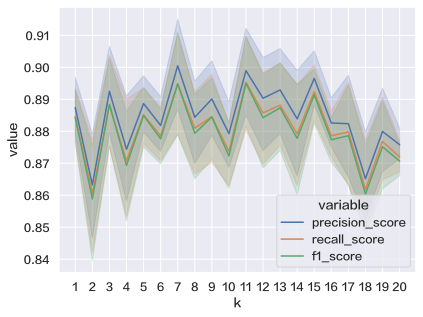

In [143]:
# from sklearn.neighbors import KDTree
from sklearn.model_selection import KFold
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
)


def knn(df):
    x = np.array(df.drop(["质量等级"], axis=1))
    y = np.array(df["质量等级"])
    # tree = KDTree(x)

    def knn_infer(x_i, k):
        # ind = tree.query(x.reshape(1, -1), k=k)[1][0]
        ind = np.argpartition(np.linalg.norm(x - x_i, axis=1), k)[:k]
        neighbors = y[ind]
        # print("neighbors", neighbors)
        counts = np.bincount(neighbors)
        # print("counts", counts)
        return np.argmax(counts)

    return knn_infer


score_df = pd.DataFrame(
    {
        "k": [],
        "precision_score": [],
        "recall_score": [],
        "f1_score": [],
    }
)
# score_df = pd.DataFrame(
#     {
#         "k": [],
#         "优": [], "良": [], "轻度污染": [], "中度污染": [], "重度污染": [], "严重污染": [],
#     }
# )
for k in range(1, 21):
    kf = KFold(n_splits=8, shuffle=True)
    for train_index, test_index in kf.split(df.values):
        # print(train)
        train = df.iloc[train_index]
        test = df.iloc[test_index]
        knn_infer = knn(train)

        y_true = test.values[:, -1].astype(int)
        y_pred = np.array([knn_infer(line[:-1], k) for line in test.values])

        precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
        recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
        f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)
        score_df.loc[len(score_df.index)] = [k, precision, recall, f1]

        # # precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
        # # recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
        # f1 = precision_score(y_true, y_pred, labels=list(range(1, 7)), average=None, zero_division=0)
        # score_df.loc[len(score_df.index)] = [k, *(f1.tolist())]


g = sns.lineplot(x="k", y="value", hue="variable", data=pd.melt(score_df, ["k"]))
g.set(xticks=list(range(1, 21)))
None

可以看到各项指标随 k 变化的波动较大。此处选用 k=7 进行后续评估。


## 评估模型

此处使用 `classification_report` 来快速完成输出。


In [144]:
from sklearn.metrics import classification_report

knn_infer = knn(df)

y_true = df_test.values[:, -1].astype(int)
y_pred = np.array([knn_infer(line[:-1], 7) for line in df_test.values])

print(classification_report(y_true, y_pred, zero_division=0))

              precision    recall  f1-score   support

           1       0.97      0.96      0.97       101
           2       0.91      0.97      0.94       186
           3       0.93      0.84      0.88        95
           4       0.88      0.88      0.88        34
           5       1.00      0.67      0.80         9

    accuracy                           0.93       425
   macro avg       0.94      0.86      0.89       425
weighted avg       0.93      0.93      0.93       425



可以看到，k=7 时，部分代表重污染的标签召回率较差，这可能与其分布形状较长有关。但总体的 F 值都达到了 0.9 以上，属于比较不错。
